# Pràctica 3 - Arnau Vancells

In [1]:
import matplotlib.pyplot as plt
from PIL import Image, ImageDraw
import numpy as np
import math
from skimage.io import imread
from scipy import ndimage
from scipy.misc import imresize
from scipy import signal
from skimage import filters
from skimage import color
from skimage.filters.rank import gradient

import imageio
%matplotlib inline

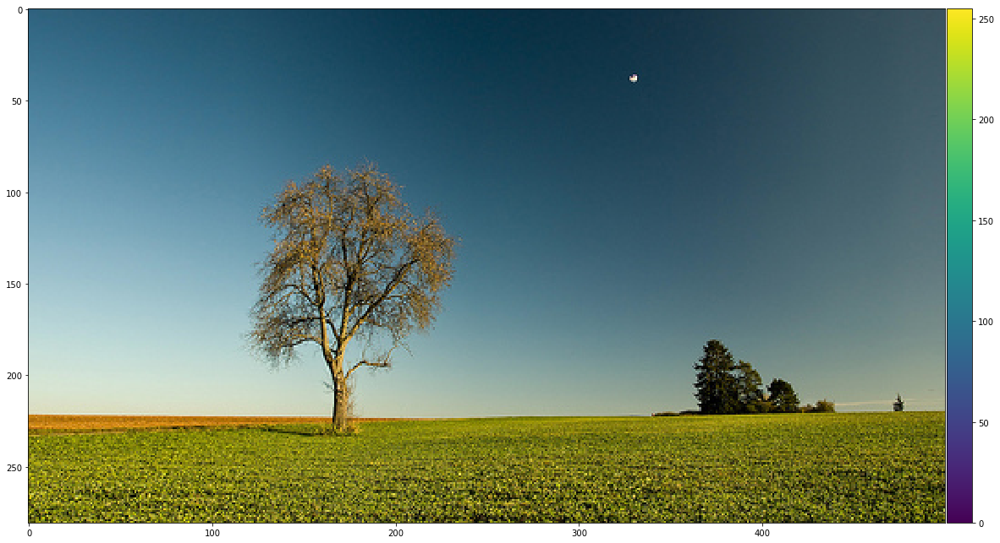

In [2]:
#LOAD IMAGES
countryside = imread("countryside.jpg")
plt.figure(figsize=(20,20))
plt.imshow(countryside)
plt.colorbar(fraction=0.0273, pad=0.002)

## Part 1: Reducció

In [13]:
def dtw_seam(image):
    dtw_result = image.copy()
    
    for i in range(1, dtw_result.shape[0]):
        dtw_result[i, 0] = dtw_result[i, 0] + min(dtw_result[i-1, 0:2])
        for j in range(1, dtw_result.shape[1]-1):
            dtw_result[i, j] = dtw_result[i, j] + min(dtw_result[i-1, j-1:j+2])
        dtw_result[i, -1] = dtw_result[i, -1] + min(dtw_result[i-1, j:j+2])
    return dtw_result
    

Per començar calcularem el gradient de la imatge, per tal d'obtenir l'"energia" de la imatge fent servir la funció definida anteriorment.

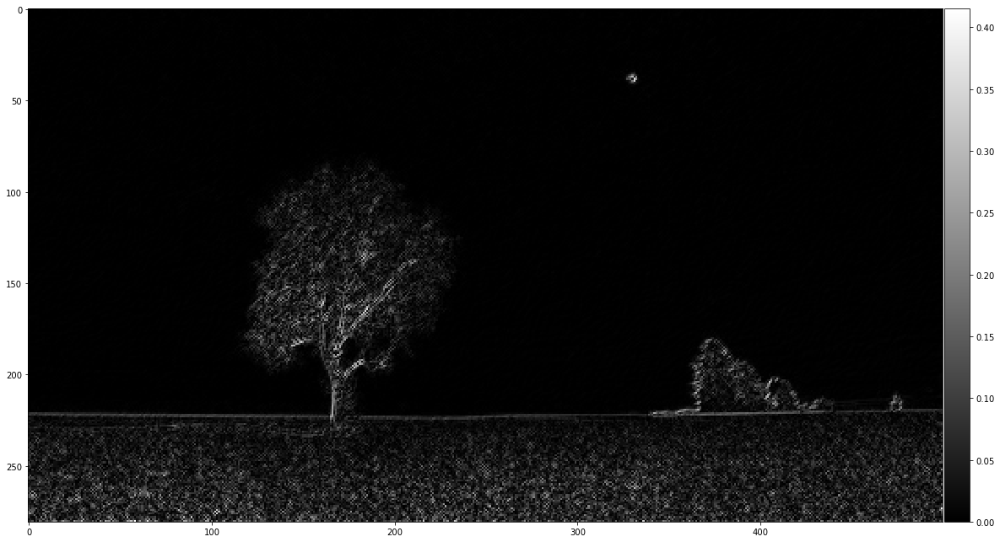

In [4]:
country_gradient = np.abs(np.mean(np.gradient(color.rgb2gray(countryside)), axis=0))

plt.figure(figsize=(20,20))
plt.imshow(country_gradient, cmap='gray')
plt.colorbar(fraction=0.0273, pad=0.002)

Apliquem l'algoritme vist a classe per obtenir la energia de la imatge.

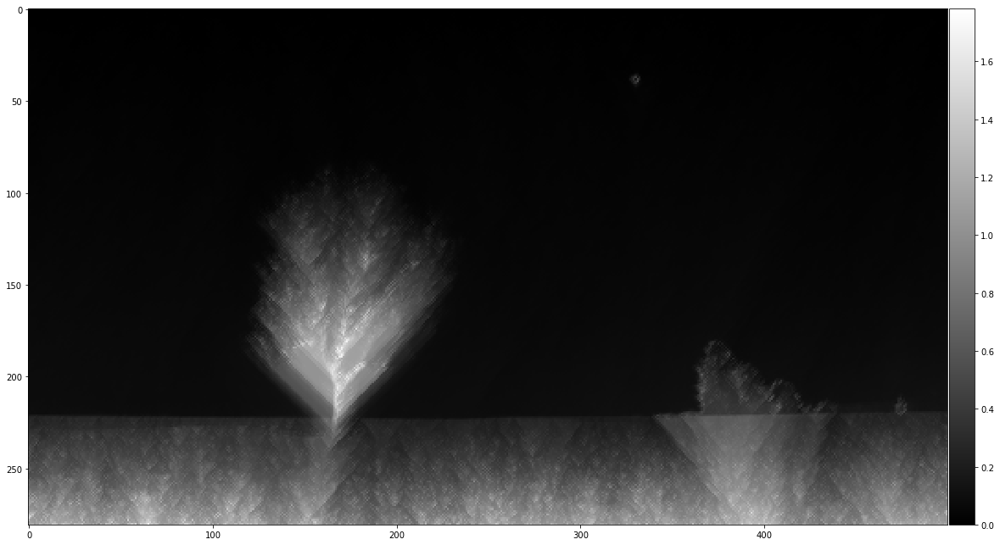

In [5]:
plt.figure(figsize=(20,20))
country_dtw = dtw_seam(country_gradient)
plt.imshow(country_dtw, cmap='gray')
plt.colorbar(fraction=0.0273, pad=0.002)

Ara definim funcions per a obtenir el seam amb menys energia de la imatge. Aquest seam l'eliminarem de la imatge per tal de realitzar la reducció de la imatge. Al ser el seam amb menys energia, és el que ens proporcionarà menys informació a la imatge, de forma que eliminar aquest seam de pixels no es notarà massa en la imatge resultant.

In [2]:
def get_seam(image_dtw, image):
    image_dtw_copy = image.copy()
    min_index = np.argmin(image_dtw[-1, :])
    seam_list = np.zeros([image_dtw.shape[0]])
    for i in range(image_dtw.shape[0]-1,-1, -1):
        if min_index == 0:
            min_index = np.argmin(image_dtw[i, min_index:min_index+2]) + min_index 
        elif min_index == image_dtw.shape[1]:
            min_index = np.argmin(image_dtw[i, min_index-1:min_index+1]) + min_index -1
        else:
            min_index = np.argmin(image_dtw[i, min_index-1:min_index+2]) + min_index -1
        
        image_dtw_copy[i,min_index] = -1
        seam_list[i] = min_index
    return image_dtw_copy, seam_list

In [3]:
def delete_seam(image, seam):
    image_new = np.zeros([image.shape[0], image.shape[1]-1, 3])
    for i in range(image.shape[0]-1,-1, -1):
        image_new[i, :, :] = np.delete(image[i, :], int(seam[i]), axis=0)
    return image_new

def delete_seam_2D(image, seam):
    image_new = np.zeros([image.shape[0], image.shape[1]-1])
    for i in range(image.shape[0]-1,-1, -1):
        image_new[i, :] = np.delete(image[i, :], int(seam[i]), axis=0)
    return image_new

In [4]:
def seam_carving_reduction(image, iterations=50):
    for i in range(iterations):
        image_dtw = dtw_seam(np.abs(np.mean(np.gradient(color.rgb2gray(image)), axis=0)))
        image_seam, seam = get_seam(image_dtw, image)
        #image_dtw = delete_seam_2D(image_seam, seam)
        #imageio.imwrite("results/image_seam_"+str(i)+".jpg", image_seam.astype("uint8"))
        image = delete_seam(image, seam)
        image = image.astype(int)
        #imageio.imwrite("results/image_reduced_"+str(i)+".jpg", image.astype("uint8"))
    imageio.imwrite("result_countryside.jpg", image.astype("uint8"))
    return image

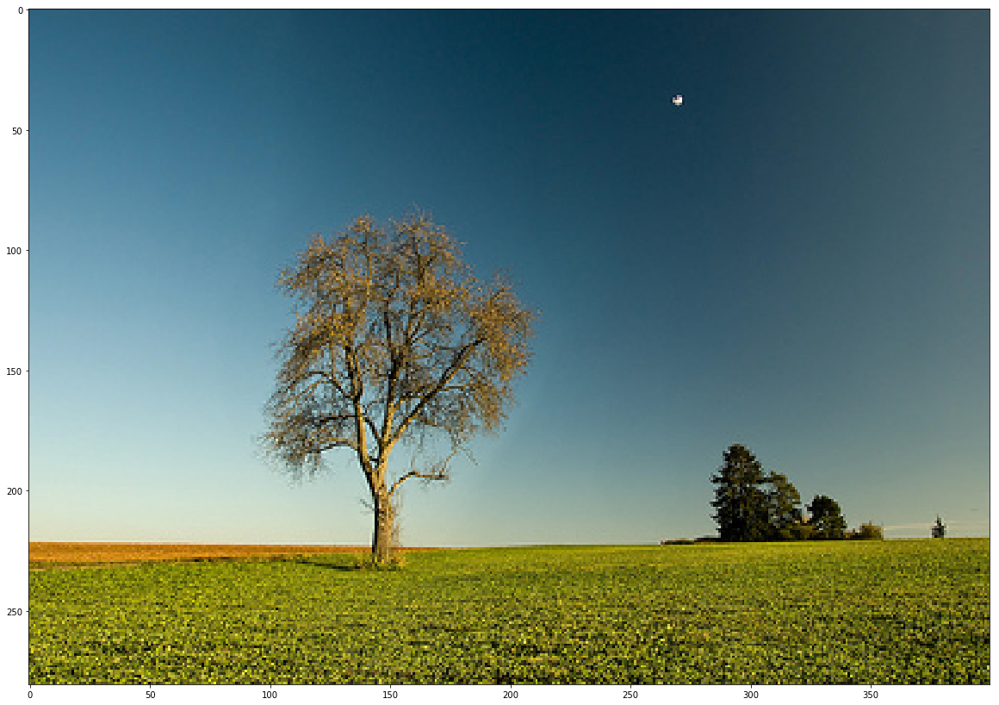

In [21]:
plt.figure(figsize=(20,20))
plt.imshow(seam_carving_reduction(countryside, iterations=100).astype("uint8"))

Veure el video **'countryside_results.mp4'** per veure el procediment de l'algoritme.

Degut a les limitacions de mida de fitxers del campus virtual el video es troba a:

https://drive.google.com/open?id=1hhGlwCIMeRr1iYofWPlJjscobyjeoL-Q

Backup a YouTube: https://www.youtube.com/watch?v=8hb_8eXdtHw

## Part 2: Eliminació

Per a eliminar un objecte d'una imatge fent servir seam carving, el que farem és modificar el gradient de la imatge per tal de forçar l'energia d'una certa regio de la imatge a tenir un valor molt baix. Al fer això, l'algoritme eliminarà seams que passen pels pixels modificats.

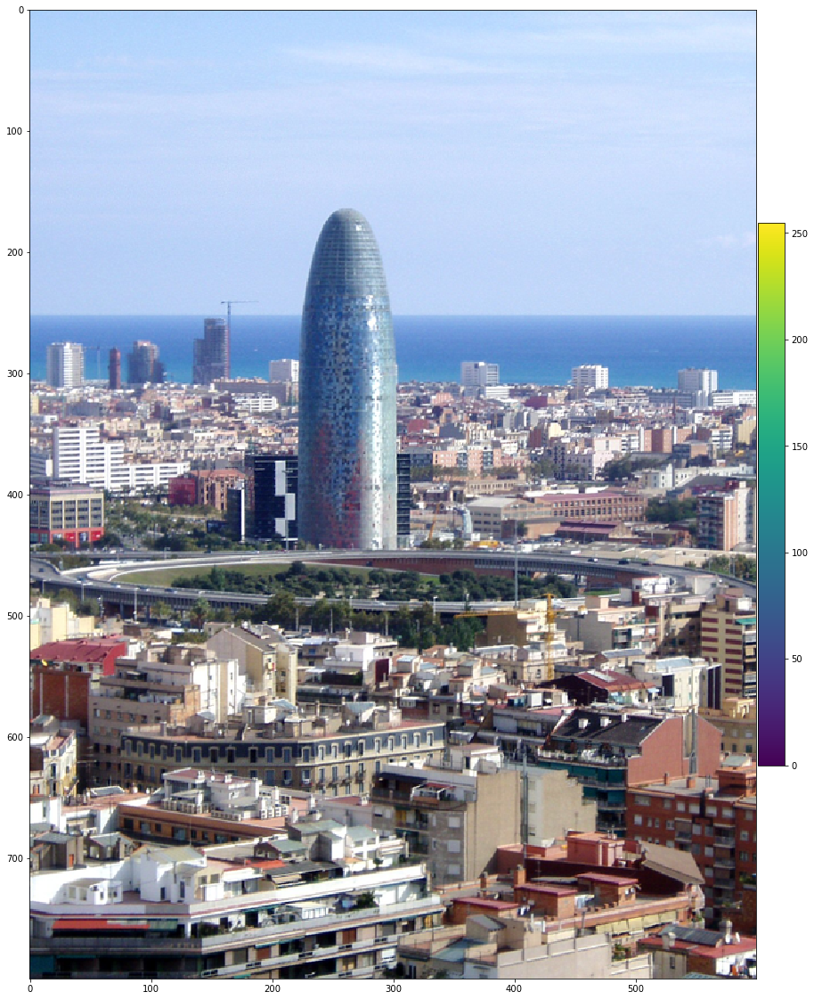

In [10]:
#LOAD IMAGES
agbar = imread("agbar.png")
plt.figure(figsize=(20,20))
plt.imshow(agbar)
plt.colorbar(fraction=0.0273, pad=0.002)

800 600


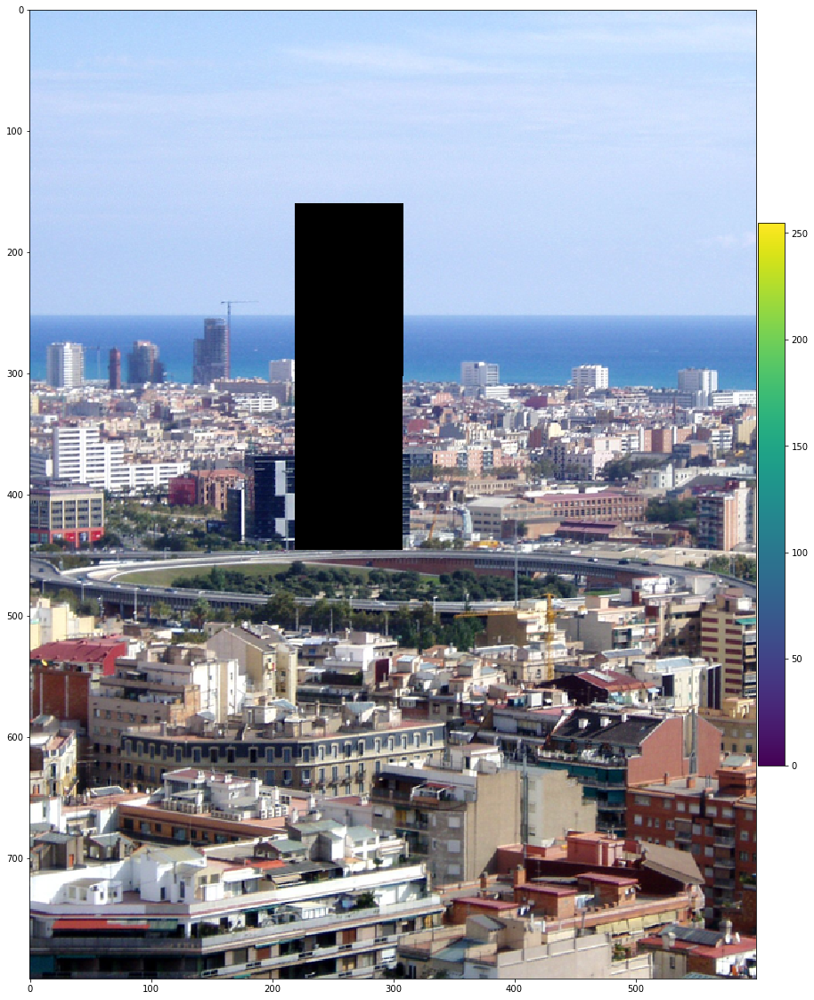

In [23]:
from skimage.io import imread
import matplotlib.pyplot as plt
from PIL import Image, ImageDraw
from skimage import color, data, restoration
import numpy as np
import math
from scipy import ndimage
from scipy.misc import imresize
import time


def compute_mask(width,height,polygon):
    
    img = Image.new('L', (width, height), 0)
    ImageDraw.Draw(img).polygon(polygon, outline=1, fill=1)
    mask = np.array(img)
    mask100 = 100*np.ones([mask.shape[0],mask.shape[1]])
    mask=mask*101
    mask = 1. - mask; # switch 0s and 1s
    return mask


RGB=data.imread('agbar.png')
scale_factor=1

RGB2 = imresize(RGB, ( round(RGB.shape[0]/scale_factor),round(RGB.shape[1]/scale_factor),3),interp='bilinear').astype('float')
img = color.rgb2gray(RGB2)
S = img.shape;
S0=S[0]
S1=S[1]
print (S0,S1)
width=S1;
height=S0;

#
## COMPUTE MASK FROM POLYGON
# vertices=[(x1,y1),(x2,y2)...]
polygon = [(round(219/scale_factor),round(160/scale_factor)),
           (round(219/scale_factor),round(445/scale_factor)),
           (round(307/scale_factor),round(445/scale_factor)),
           (round(308/scale_factor),round(160/scale_factor))]
mask=np.ones([S0,S1],dtype=np.double) #if compute_mask is disabled
mask=compute_mask(width,height,polygon)

plt.figure(figsize=(20,20))
agbar_copy = RGB2.copy()
agbar_copy[mask==-100]= 0
plt.imshow(agbar_copy.astype("uint8"))
plt.colorbar(fraction=0.0273, pad=0.002)




En la imatge anterior es pot veure els pixels on es modificarà el gradient, com que volem eliminar la torre agbar de la imatge s'ha fet una mascara que cobreix la totalitat de la torre.

Apliquem la reducció de seam carving, però afegint l'utilització de la màscara en el gradient.

In [5]:
def seam_carving_elimination(image, mask, iterations=50):
    for i in range(iterations):
        image_gradient = np.abs(np.mean(np.gradient(color.rgb2gray(image)), axis=0))
        image_gradient[mask==-100]-=1000
        image_dtw = dtw_seam(image_gradient)
        image_seam, seam = get_seam(image_dtw, image)
        #image_dtw = delete_seam_2D(image_seam, seam)
        ##imageio.imwrite("image_dtw_"+str(i)+".jpg", image_gradient.astype("uint8"))
        #imageio.imwrite("results/image_seam_"+str(i)+".jpg", image_seam.astype("uint8"))
        image = delete_seam(image, seam)
        mask = delete_seam_2D(mask, seam)
        image = image.astype(int)
        #imageio.imwrite("results/image_reduced_"+str(i)+".jpg", image.astype("uint8"))
    imageio.imwrite("result_agbar.jpg", image.astype("uint8"))
    return image

A la imatge resultant podem veure com s'ha eliminat correctament la torre de la imatge, tot i que si ens fixem en la imatge es poden veure rastres de l'eliminació de seams.

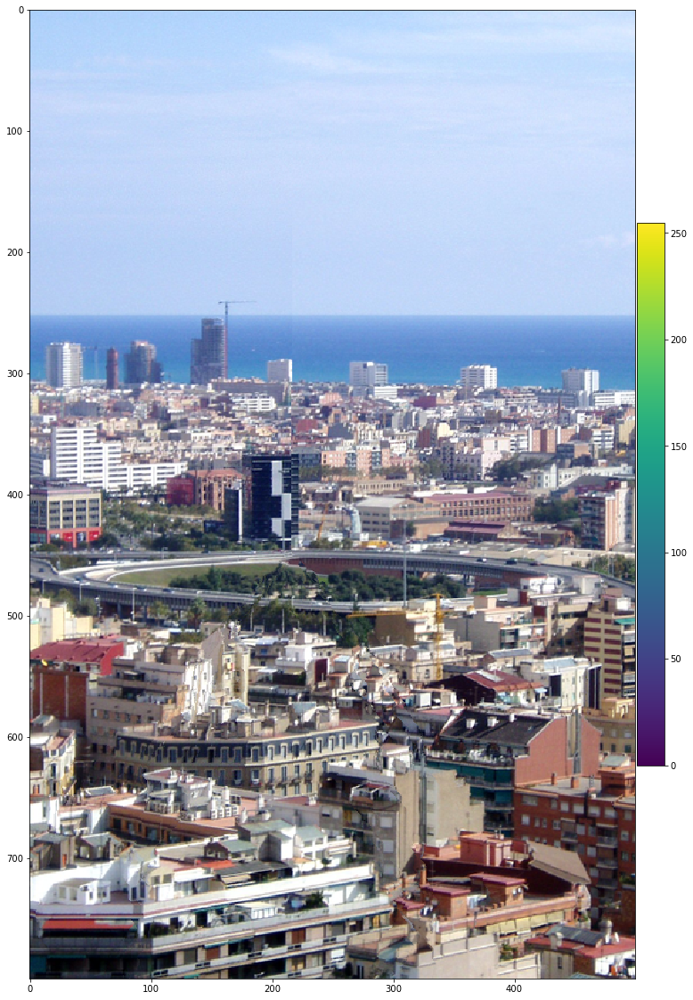

In [25]:
plt.figure(figsize=(20,20))
plt.imshow(seam_carving_elimination(RGB2, mask, iterations=100).astype("uint8"))
plt.colorbar(fraction=0.0273, pad=0.002)

Veure el video **'agbar_results.mp4'** per veure el procediment de l'algoritme.

Degut a les limitacions de mida de fitxers del campus virtual el video es troba a:

https://drive.google.com/open?id=1MSHeOMeIqd5Kc_mPH1o6XsRhkcVNV6rW

Backup a YouTube: https://www.youtube.com/watch?v=gJ80mAa0BnU

## Part 3: Síntesis

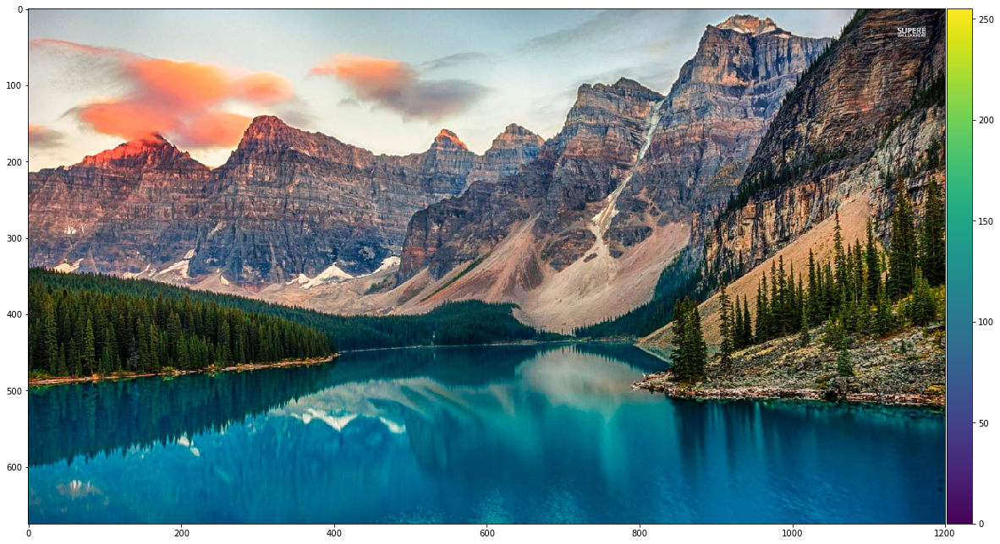

In [17]:
#LOAD IMAGES
countryside = imread("synthesis.jpg")
plt.figure(figsize=(20,20))
plt.imshow(countryside)
plt.colorbar(fraction=0.0273, pad=0.002)

Per a fer la síntesis de una imatge, buscarem les seams mínimes i n'afegirem una nova, fent servir la mitja dels valors entre la seam original i la que hi ha al costat de la seam que estem afegint. Així s'aconseguirà que el fet d'afegir una linea de pixels no sigui massa notable.

També es pot afegir un augment d'energia en els veïns del seam utilitzat, per tal d'evitar l'ús de seams contigues per a augmentar la mida de la imatge. Això ho podem fer modificant el gradient.

Això farà que els seams utilitzats no es dupliquin més d'un cop, però a canvi forçarà, al cap d'unes quantes iteracions(variarà en funció de la mida de la imatge) que es dupliqui informació amb molta informació, com és el cas de l'arbre.

In [10]:
def add_seam(image, seam, image_gradient):
    image_new = np.zeros([image.shape[0], image.shape[1]+1, 3])
    image_gradient_new = np.zeros([image_gradient.shape[0], image_gradient.shape[1]+1])
    for i in range(image.shape[0]-1,-1, -1):
        if(int(seam[i]) == image.shape[1]-1):
            fill_value = image[i, int(seam[i])]
        else:
            fill_value = (((image[i, int(seam[i]) + 1]).astype(int) + (image[i, int(seam[i])]).astype(int))/2).astype(int)
            
        image_new[i, :, :] = np.insert(image[i, :], int(seam[i] + 1), fill_value, axis=0)
        
        # increase energy of used seams
        image_gradient_new[i, :] = np.insert(image_gradient[i, :], int(seam[i] + 1), image_gradient[i, int(seam[i])] + 1000, axis=0) 
        image_gradient_new[i, int(seam[i])] += 1000
        if(int(seam[i]) != image.shape[1]-1):
            image_gradient_new[i, int(seam[i]) + 2] += 1000
        if(int(seam[i]) != 0):
            image_gradient_new[i, int(seam[i]) - 1] += 1000
    return image_new, image_gradient_new

In [22]:
def seam_carving_synthesis(image, iterations=50):
    seam_list = []
    image_gradient = np.abs(np.mean(np.gradient(color.rgb2gray(image)), axis=0))
    for i in range(iterations):   
        image_dtw = dtw_seam(image_gradient)
        image_seam, seam = get_seam(image_dtw, image)
        seam_list.append(seam)
        #imageio.imwrite("results/image_seam_"+str(i)+".jpg", image_seam.astype("uint8"))
        image, image_gradient = add_seam(image, seam, image_gradient)
        image = image.astype(int)
        #imageio.imwrite("results/image_increased_"+str(i)+".jpg", image.astype("uint8"))
    imageio.imwrite("result_synthesis.jpg", image.astype("uint8"))
    
    image_full_seams = image.copy()
    for seam in seam_list:
        for i in range(image.shape[0]-1,-1, -1):
            image_full_seams[i, int(seam[i])] = [255, 0, 0]
    imageio.imwrite("result_synthesis_seams.jpg", image_full_seams.astype("uint8"))
    
    return image

He realitzat les probes amb 400 iteracions, que són bastantes considerant la mida de la imatge. El resultat és molt interessant, doncs no es nota la diferència entre la imatge amb synthesis i sense. 

**Nota: la imatge utilitzada és molt gran, per tant pot trigar bastanta estona en realitzar-se la síntesis per a 400 iteracions(10 min aprox.)**

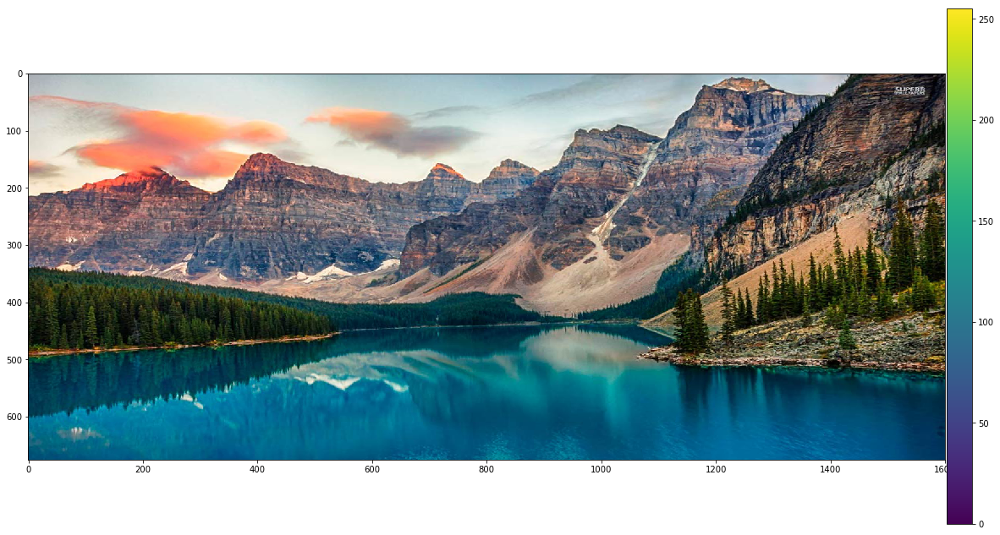

In [18]:
plt.figure(figsize=(20,20))
plt.imshow(seam_carving_synthesis(countryside, iterations=35).astype("uint8"))
plt.colorbar(fraction=0.0273, pad=0.002)

Veure el video **'synthesis_results.mp4'** per veure el procediment de l'algoritme.

Degut a les limitacions de mida de fitxers del campus virtual el video es troba a:

https://drive.google.com/open?id=1-Pq5hZ_43YsuRsO-6UbacWq6aPBBg2L0

Backup a Youtube: https://www.youtube.com/watch?v=mqfjIi9Y4vM

## A continuació es pot veure els resultats de les 3 tècniques

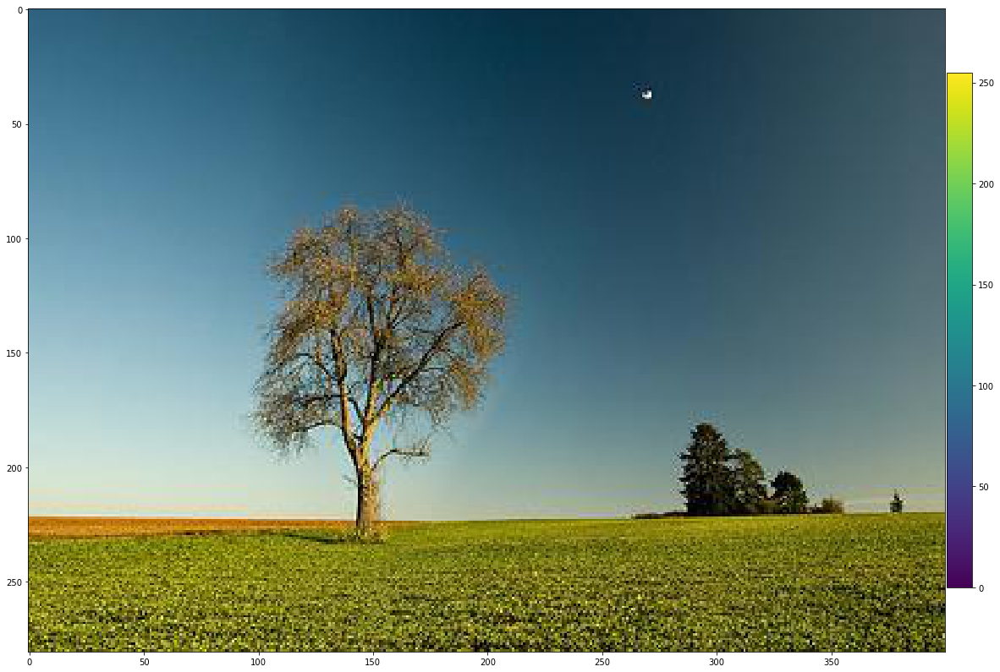

In [19]:
#LOAD IMAGES
result_1 = imread("result_countryside.jpg")
plt.figure(figsize=(20,20))
plt.imshow(result_1)
plt.colorbar(fraction=0.0273, pad=0.002)

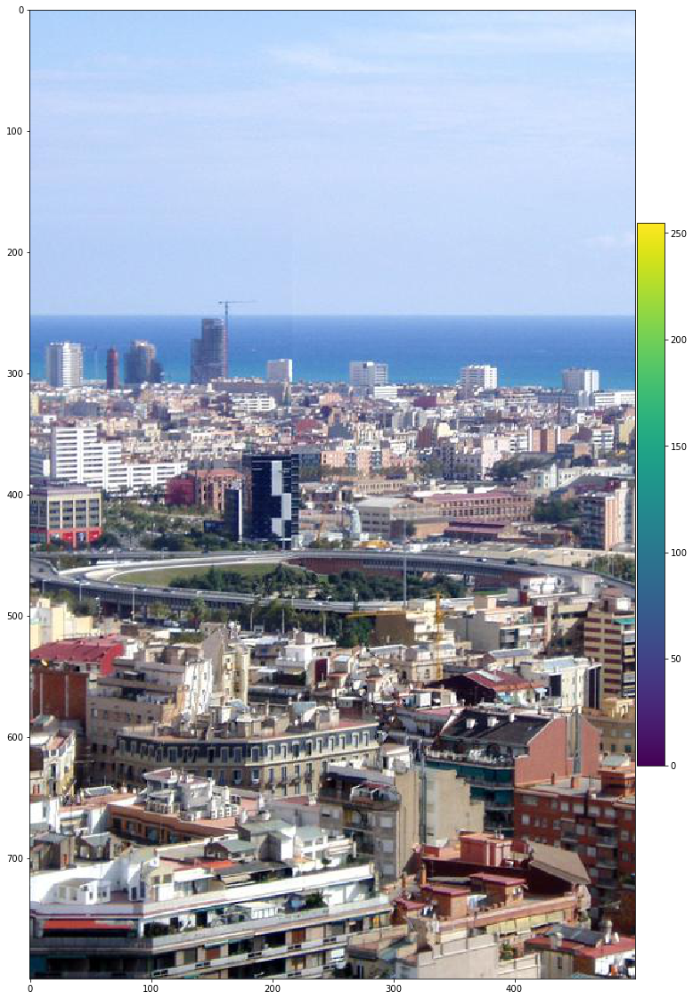

In [20]:
#LOAD IMAGES
result_2 = imread("result_agbar.jpg")
plt.figure(figsize=(20,20))
plt.imshow(result_2)
plt.colorbar(fraction=0.0273, pad=0.002)

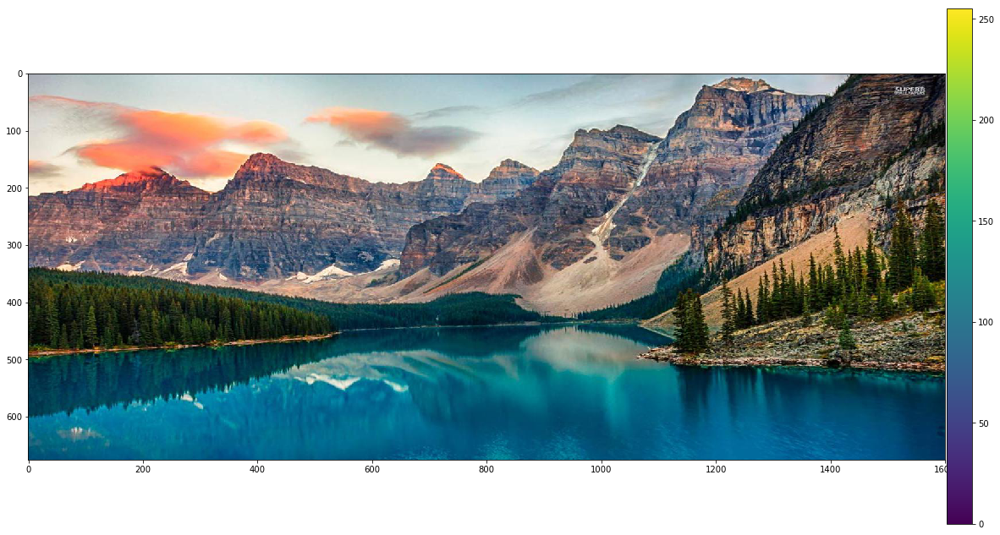

In [21]:
#LOAD IMAGES
result_3 = imread("result_synthesis.jpg")
plt.figure(figsize=(20,20))
plt.imshow(result_3)
plt.colorbar(fraction=0.0273, pad=0.002)